# Single cell transcriptomics data analysis using package "scanpy"

* This code loads the sample spatial transcriptomics dataset from the Spatial Transcriptomics website, the distribution of gene expression and total counts per cell, preprocesses the data, performs clustering using the Leiden algorithm, and visualizes the results using UMAP. The resulting plot shows the different cell types identified by the clustering algorithm.

## load the dataset using sc.datasets.visium_sge 

In [42]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

#sc.logging.print_versions()
sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.verbosity = 3

adata = sc.datasets.visium_sge(sample_id="V1_Human_Lymph_Node")
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

reading /Users/justin/SoftwareDevelopment/Python/bioinformatics/data/V1_Human_Lymph_Node/filtered_feature_bc_matrix.h5
 (0:00:00)


/Users/justin/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


## Distribution of Gene expression and Number of genes

* "total_counts" refers to the total number of sequencing reads or molecules (e.g., mRNA transcripts) that were detected in each individual cell.  It represents a measure of the overall RNA content or expression level within a cell. Total counts can be used as a proxy for the cell's size or the amount of RNA present.
* "n_genes_by_counts" represents the number of unique genes (or features) detected in each cell. It indicates the diversity of gene expression within a cell and can be used as a measure of cellular complexity or transcriptional activity. Cells with a higher number of genes detected generally exhibit more diverse gene expression profiles.
* Both "total_counts" and "n_genes_by_counts" are commonly used quality control metrics in scRNA-seq analysis. They can provide insights into the distribution of sequencing depth across cells and help identify potential outliers or low-quality cells. By visualizing the histograms of these variables, you can gain an understanding of the distribution patterns and assess the overall quality of your scRNA-seq dataset.

<Axes: xlabel='n_genes_by_counts', ylabel='Count'>

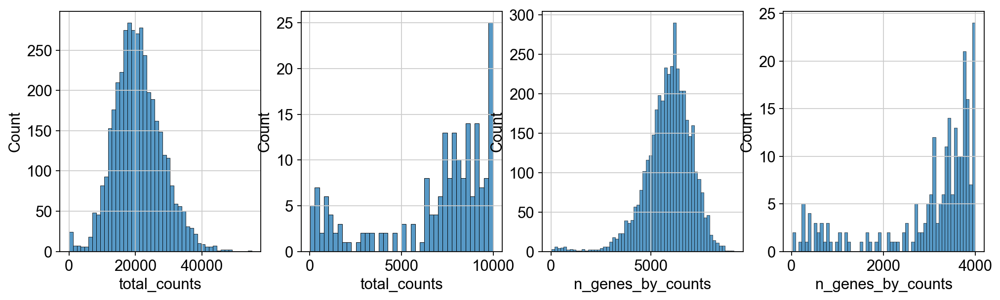

In [43]:
fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.histplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.histplot(adata.obs["total_counts"][adata.obs["total_counts"] < 10000], kde=False, bins=40, ax=axs[1])
sns.histplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2])
sns.histplot(adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 4000], kde=False, bins=60, ax=axs[3])

## Preprocessing data; Clustering cells and visualization; Identify marker genes using differential expression analysis

* In this code, we first load the dataset using sc.datasets.visium_sge and then proceed with preprocessing steps such as gene filtering, normalization, and log transformation. Next, we perform dimensionality reduction using PCA and generate a UMAP plot for visualization.

* We then cluster the cells using the Leiden algorithm and visualize the clusters on the UMAP plot. Afterwards, we identify marker genes for each cluster using differential expression analysis and visualize the results.

* Finally, we perform differential expression analysis using the Wilcoxon test, explore gene expression patterns for specific genes, and save the processed data using the write method.

reading /Users/justin/SoftwareDevelopment/Python/bioinformatics/data/V1_Human_Lymph_Node/filtered_feature_bc_matrix.h5
 (0:00:00)


/Users/justin/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


filtered out 14190 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes


/Users/justin/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


/Users/justin/miniconda3/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


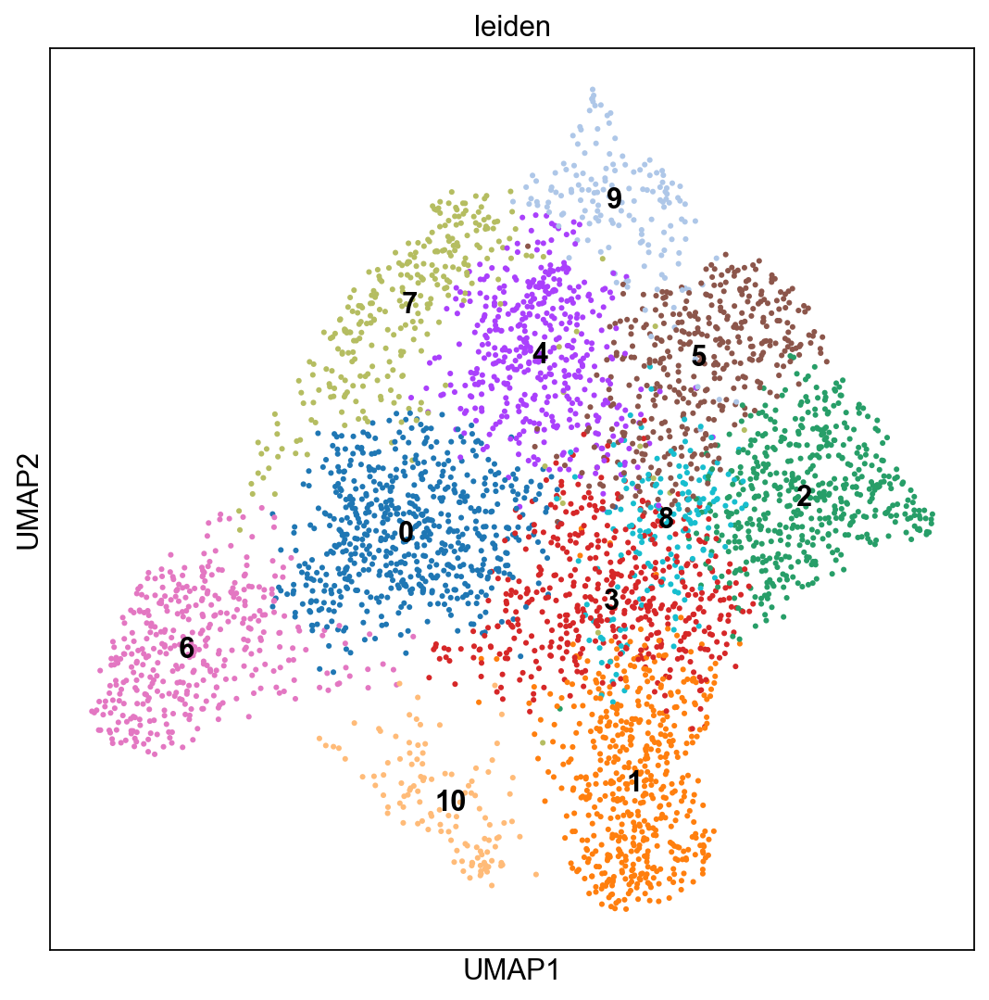

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


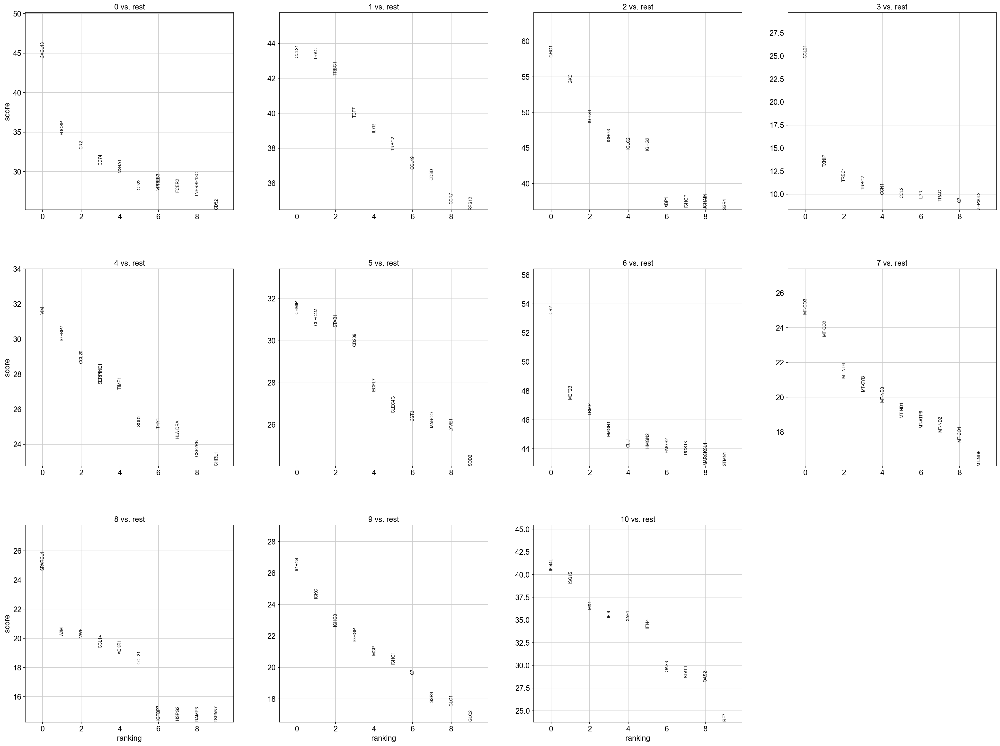

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:06)


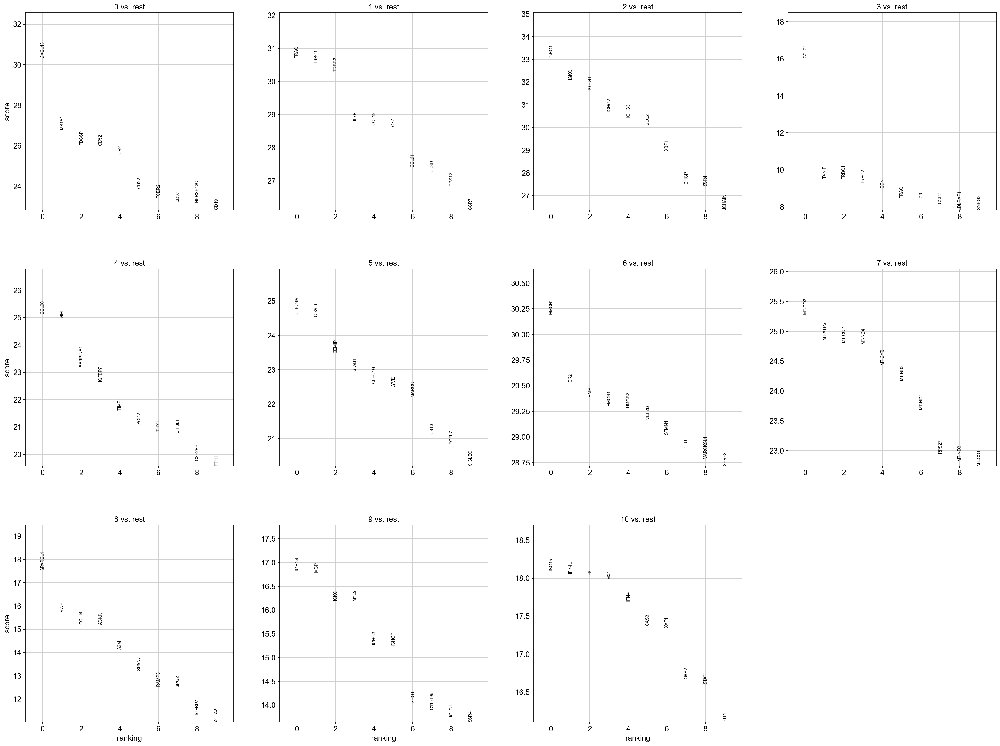

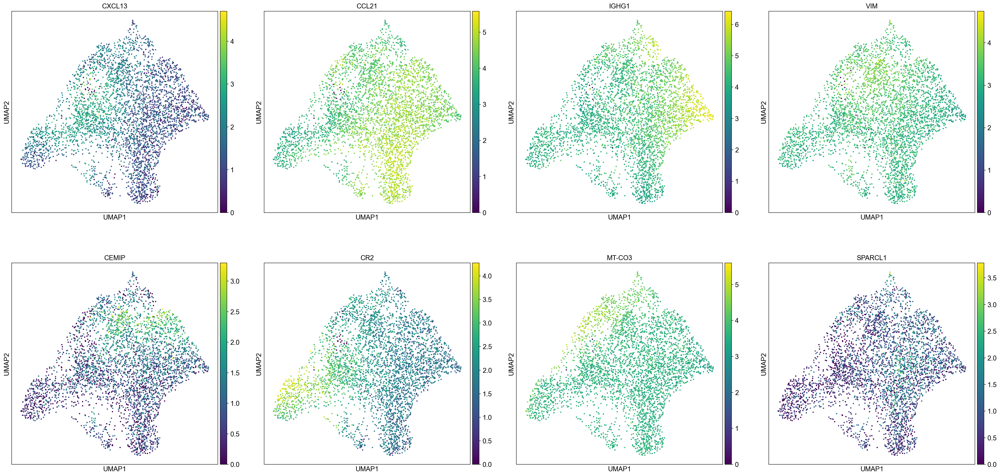

In [44]:
import scanpy as sc

# Load the dataset
adata = sc.datasets.visium_sge(sample_id="V1_Human_Lymph_Node")

# Preprocess the data
sc.pp.filter_genes(adata, min_cells=3)
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

# Perform dimensionality reduction
sc.pp.highly_variable_genes(adata, n_top_genes=2000)
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata)
sc.tl.umap(adata)

# Cluster the cells
sc.tl.leiden(adata)

# Visualize the results
sc.pl.umap(adata, color=['leiden'], legend_loc='on data')

# Identify marker genes for each cluster
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=10, sharey=False)

# Perform differential expression analysis
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=10, sharey=False)

# Check if gene exists and visualize gene expression patterns
gene_names = ['CXCL13', 'CCL21', 'IGHG1', 'VIM', 'CEMIP', 'CR2', 'MT-CO3', 'SPARCL1'] #['Ccl19', 'Il7r', 'Pecam1']
available_genes = [gene for gene in gene_names if gene in adata.var_names]
if available_genes:
    sc.pl.umap(adata, color=available_genes, use_raw=False)

# Save the results
adata.write('processed_data.h5ad')



## Reload saved AnnData and create visualization of marker genes

/Users/justin/miniconda3/lib/python3.10/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


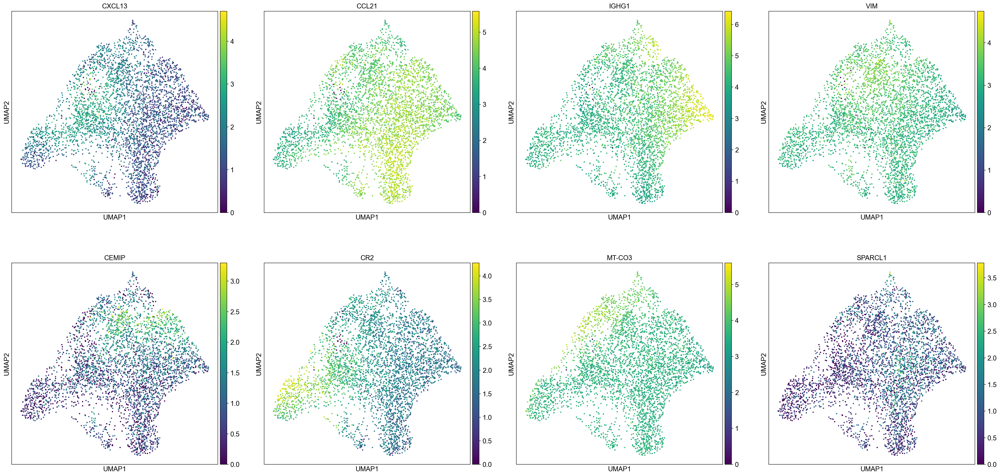

In [45]:
import scanpy as sc

# Load the saved AnnData object
adata = sc.read_h5ad('processed_data.h5ad')

# Access and explore the loaded data
#print(adata)
adata.var_names
gene_names = ['CXCL13', 'CCL21', 'IGHG1', 'VIM', 'CEMIP', 'CR2', 'MT-CO3', 'SPARCL1'] #['Ccl19', 'Il7r', 'Pecam1']
available_genes = [gene for gene in gene_names if gene in adata.var_names]
sc.pl.umap(adata, color=available_genes, use_raw=False)

# Perform further analysis on the loaded data
# ...
